# Importing Packages

In [241]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import PIL
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

# Utility Functions

In [242]:
def display_image(tensor,index=0):
    """
    Displays the image.\n\n

    Arguments:\n
    tensor -- A 4D tensor representing an image or an array of images.\n
    index -- Index of image in the tensor to display. By default it will display the zeroth image.\n
    """
    plt.imshow(tensor[index])
    plt.show()

def convert_to_tensor(path,shape=(512,512,3)):
    """
    Converts image into a tf.Tensor object.\n\n

    Arguments:\n
    path -- Path to the image in the directory.\n
    shape -- Dimensions of the image (length and width).\n

    Returns:\n
    tensor -- Tensor of shape (1,shape,3) with float 32 values.\n
    """
    image = np.array(PIL.Image.open(path).resize(shape))
    image = tf.constant(np.reshape(image, ((1,)+image.shape)))
    return image

def preprocess_image(tensor,dtype=tf.float32):
    """ 
    Converts tf.Tensor tensor into given dtype and then into tf.Variable object.\n\n

    Arguments:\n
    tensor -- tf.Tensor representation of the image.\n
    dtype -- dtype object the tensor has to be converted to.\n\n

    Returns:\n
    preprocessed_image -- tf.Variable tensor of the image.\n
    """
    preprocessed_image = tf.Variable(tf.image.convert_image_dtype(tensor,dtype=dtype))
    return preprocessed_image

def random_noise_generator_normal(image=None,mean=0.0,stddev=1.0,intensity=0.25,shape=(1,512,512,3)):
    """
    Adds noise to images (tf.Tensor) or generates image with noise sampled from the normal distribution. \n\n

    Arguments: \n
    image -- tf.Tensor object representing the image.\n
    stddev -- Standard deviation of the distribution.\n
    mean -- Mean of the distribution.\n
    instensity -- A weight multiplied to the noise.\n\n
    
    Returns:\n
    noise -- A tf.Tensor representing the image with random noise.\n
    OR\n
    noisy_image -- A tf.Tensor representing the image with random noise added to it.\n
    """
    if image != None:
        tensor = tf.image.convert_image_dtype(image,tf.float32)
        noise = tf.random.normal(tensor.shape,mean=mean,stddev=stddev)
        noisy_image = tf.add(tensor,tf.multiply(intensity,noise))
        noisy_image = tf.clip_by_value(noisy_image, clip_value_min=0.0, clip_value_max=1.0)
    else:
        noisy_image = tf.random.normal(shape,mean=mean,stddev=stddev)
        noisy_image = tf.clip_by_value(noisy_image, clip_value_min=0.0, clip_value_max=1.0)
    return noisy_image

def random_noise_generator_uniform(image=None,minval=-0.25,maxval=0.25,intensity=1.0,shape=(1,512,512,3)):
    """
    Adds noise to images (tf.Tensor) or generates image with noise sampled from the uniform distribution. \n\n

    Arguments: \n
    image -- tf.Tensor object representing the image.\n
    minval -- Minimum value of the distribution.\n
    maxval -- Maximum value of the distribution.\n
    instensity -- A weight multiplied to the noise.\n\n
    
    Returns:\n
    noise -- A tf.Tensor representing the image with random noise.\n
    OR\n
    noisy_image -- A tf.Tensor representing the image with random noise added to it.\n
    """
    if image != None:
        tensor = tf.image.convert_image_dtype(image,tf.float32)
        noise = tf.random.uniform(tensor.shape,minval=minval,maxval=maxval)
        noisy_image = tf.add(tensor,tf.multiply(intensity,noise))
        noisy_image = tf.clip_by_value(noisy_image, clip_value_min=0.0, clip_value_max=1.0)
    else:
        noise = tf.random.uniform(shape,minval=minval,maxval=maxval)
        noisy_image = tf.clip_by_value(noisy_image, clip_value_min=0.0, clip_value_max=1.0)
    return noisy_image

def convert_to_image(tensor):
    """
    Converts the given tensor into a PIL image.\n\n
    
    Arguments:\n
    tensor -- Tensor.\n\n
    
    Returns:\n
    Image: A PIL image\n
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def show_images_in_a_row(content_image,style_image,generated_image):
    """
    Generates three subplots to compare the content, style and generated images.\n\n

    Arguments:\n
    content_image: A tensor representing the content image.\n
    style_image: A tensor representing the style image.\n
    generated_image: A tensor representing the generated image.\n

    Returns:
    None
    """
    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_subplot(1, 3, 1)
    plt.imshow(content_image[0])
    ax.title.set_text('Content image')
    ax = fig.add_subplot(1, 3, 2)
    plt.imshow(style_image[0])
    ax.title.set_text('Style image')
    ax = fig.add_subplot(1, 3, 3)
    plt.imshow(generated_image[0])
    ax.title.set_text('Generated image')
    plt.show()

# The Loss

## Content Loss

$$L_{content} = \frac{1}{2} \sum_{i,j,c}(G^{l}-A^{l})^{2}$$

where,

$n_{H}$ : Height of feature map of $l^{th}$ layer.

$n_{W}$ : Width of feature map of $l^{th}$ layer.

$n_{C}$ : Number of channels in feature map of $l^{th}$ layer.

$G^{l}$ : Feature map of $l^{th}$ layer of generated image.

$A^{l}$ : Feature map of $l^{th}$ layer of content image.

In [259]:
def compute_content_loss(a_O,a_G):
    """
    Computes the content loss for a content image and a generated image.\n\n

    Arguments:\n
    a_O -- List of the content tf.Tensor's of shape (1,n_H,n_W,n_C).\n
    a_G -- List of the generated tf.Tensor's of shape (1,n_H,n_W,n_C).\n\n

    Returns:\n
    L_content -- Total content loss.
    """

    #Extract last array from the a_0, a_G since it's the feature map of the content layer.
    a_O = a_O[-1]
    a_G = a_G[-1]

    #Extract dimensions
    _, n_H, n_W, n_C = a_O.shape

    #Compute cost.
    cost = (1.0/(4.0*(n_H*n_W*n_C)*(n_H*n_W*n_C)))*tf.square(tf.subtract(a_G,a_O))

    #Compute total loss
    L_content = tf.reduce_sum(cost)

    return L_content

## Style Loss

### Gram Matrix

$$Gram = A^{\top}A$$

where,

$A$ : Unrolled tensor matrix with shape $(n_{H}\times n_{W},n_{C})$.

In [260]:
def gram_matrix(tensor):
    """ 
    Shrinks dimension of tensor to 3D and computes the gram matrix.\n\n

    Arguments:\n
    tensor -- tf.Tensor of shape (1,n_H,n_W,n_C).\n\n

    Returns:
    gram -- Gram matrix of shape (n_H*n_W,n_C).\n
    """
    #Extracting 3D array from a 4D one.
    tensor = tensor[-1]

    #Get shape of the feature map.
    n_H, n_W, n_C = tensor.shape

    #Unrolling the tensor into 2D matrix.
    tensor_unrolled = tf.reshape(tensor,shape=[n_H*n_W,n_C])

    #Computing gram matrix.
    gram = tf.matmul(tf.transpose(tensor_unrolled),tensor_unrolled)
    
    return gram

### Layer Loss

$$L_{l} = \frac{1}{4 \times (n_{H} \times n_{W} \times n_{C})^{2}} \sum_{i,j} (G_{gram}^{l}-S_{gram}^{l})^{2}$$

where,

$n_{H}$ : Height of feature map of $l^{th}$ layer.

$n_{W}$ : Width of feature map of $l^{th}$ layer.

$n_{C}$ : Number of channels in feature map of $l^{th}$ layer.

$G_{gram}^{l}$ : Gram matrix of the feature map of $l^{th}$ layer of generated image.

$S_{gram}^{l}$ : Gram matrix of the feature map of $l^{th}$ layer of style image.

In [261]:
def compute_layer_style_loss(a_S,a_G):
    """ 
    Computes style loss of feature maps produced by a certain layer.

    Arguments:\n
    a_S -- The style tf.Tensor of shape (1,n_H,n_W,n_C).\n
    a_G -- The generated tf.Tensor of shape (1,n_H,n_W,n_C).\n\n

    Returns:
    layer_loss -- Stlye loss of the layer.
    """

    #Extracting dimensions of tensors
    n_H, n_W, n_C = a_S[-1].shape
    
    #Gram matrix of generated image feature map.
    generated_gram = gram_matrix(a_G)

    #Gram matrix of style image feature map.
    style_gram = gram_matrix(a_S)

    #Layer cost
    layer_cost = (1.0/(4.0*(n_H*n_W*n_C)*(n_H*n_W*n_C)))*tf.square(tf.subtract(generated_gram,style_gram))

    #Layer loss
    layer_loss = tf.reduce_sum(layer_cost)
    
    return layer_loss

### Total Style Loss

$$L_{style} = \sum_{l=1}^n w_{l}L_{l}$$

where,

$w_{l}$ : Weight of the loss of the $l^{th}$ layer.

$L_{l}$ : Loss of the $l^{th}$ layer.

$n$ : Number of style layers.

In [262]:
def compute_style_loss(layer_outputs_generated,layer_outputs_style,w):
    """ 
    Computes total loss of all the layers.\n\n

    Arguments:\n
    layer_outputs_generated -- List of feature maps of the generated image.\n
    layer_outputs_style -- List of feature maps of the style image.\n
    w -- Weight added to each layer loss.\n\n

    Returns:
    L_style -- Total style loss of all the layers.\n
    """
    
    #Initiating variable for total loss of all the layers.
    L_style = 0.0

    #The last layer output in the string is the content representation.
    a_S = layer_outputs_style[:-1]
    a_G = layer_outputs_generated[:-1]

    #Iterating through the loop of a list of layer outputs of generated and style image feature, multiplying them by w and adding them up.
    for i in range(len(a_G)):
        L_layer = compute_layer_style_loss(a_S[i],a_G[i])
        L_style += w*L_layer

    return L_style


## Total Variation Loss

$$ L_{variation} = \sum_{i,j,c}((x_{i,j,c}-x_{i+1,j,c})^{2}-(x_{i,j,c}-x_{i,j+1,c})^{2}) $$

where, 

$x_{i,j,c}$ : Value of the $i^{th}$ row, $j^{th}$ column and $c^{th}$ channel in $x$ which is a $4D$ tensor.



In [263]:
def compute_total_variation_loss(a_G):
    """
    Computes total variation loss of generated image.\n\n
    
    Agruments:\n
    a_G -- Generated image
    
    Returns:\n
    L_variation -- Total variation loss.
    
    """  
    #Extracting dimensions of tensors
    n_H, n_W, _ = a_G[-1].shape
    
    a = tf.square(
        a_G[:,:n_H-1,:n_W-1:] - a_G[:,1:,:n_W-1,:]
    )
        
    b = tf.square(
        a_G[:,:n_H-1,:n_W-1,:] - a_G[:,:n_H-1,1:,:]
    )
    
    L_variation = tf.reduce_sum(tf.pow(a+b,1.25))
    
    return L_variation

## Total Loss

$$ L = \alpha L_{content} + \beta L_{style} + \gamma L_{variation} $$

where,

$\alpha$ : Weight on content loss.

$\beta$ : Weight on style loss.

In [264]:
@tf.function
def compute_total_loss(L_content,L_style,L_variation,alpha=1e-1,beta=1e-2,gamma=1e-2):
    """
    Computes the total loss.\n\n
    
    Arguments:\n
    L_content -- Content loss.\n
    L_style -- Style loss.\n
    alpha -- Weight of content loss.\n
    beta -- Weight of style loss.\n\n
    
    Returns:\n
    L -- Total loss.\n
    """

    L = tf.add(tf.add(alpha*L_content,beta*L_style),gamma*L_variation)

    return L

# The Model

In [265]:
# List of Style and Content layers whose outputs we desire.

STYLE_LAYERS = (
    'block1_conv1',
    'block2_conv1',
    'block3_conv1',
    'block4_conv1',
    'block5_conv1')

CONTENT_LAYER = (
    'block5_conv2',
)

In [266]:
def model_outputs(model,STYLE_LAYERS,CONTENT_LAYER):
    """ 
    Returns a model to compute feature maps at the desired layers.\n
    This model returns a list of feature maps (Tensor object) from the desired layers in the tuple arguments. The last tensor is the content map.\n\n

    Arguments:\n
    model -- A tf.keras.Model object whose layer outputs we want.\n
    STYLE_LAYER -- A tuple with the names of style layers.\n
    CONTENT_LAYER -- A tuple with the names of content layers.\n\n

    Returns:\n
    output_model -- Model to compute feature maps from the desired layers.\n
    """ 
    #Define a list which will contain the outputs of the layers from the tuples in the argument.
    outputs = []

    #Iterate through the STYLE_LAYERS and append them to the list.
    for layer in STYLE_LAYERS:
        outputs.append(model.get_layer(layer).output)
    
    #Iterate through the CONTENT_LAYERS and append them to the list.
    for layer in CONTENT_LAYER:
        outputs.append(model.get_layer(layer).output)

    #Define the model with its inputs and outputs
    output_model = tf.keras.Model(inputs = [model.input], outputs = outputs)

    return output_model

# Train Step

In [298]:
@tf.function
def train_step(model,generated_image,encoded_style,encoded_content,optimizer,alpha=2.5e-8,beta=1e-6,gamma=1e-6):
    """
    Returns the optimized generated image after a single iteration and the loss as well.\n\n
    
    Arguments:\n
    model -- tf.keras.Model from which we want to get the feature map.\n
    generated_image -- Tensor of the generated image.\n
    encoded_style -- Feature maps of the style image.\n
    encoded_content -- Feature maps of the content image.\n
    optimizer -- Optimizer.\n 
    alpha -- Weight on content loss.\n
    beta -- Weight on style loss.
    gamma -- Weight on total variation loss.\n\n
    
    Returns:\n
    generated_image -- Generated image tensor optimized after a single train step.\n
    L -- Total loss of train step.\n
    """

    with tf.GradientTape() as tape:

        tape.watch(generated_image)

        #Compute feature map generated image.
        a_G = model(generated_image)

        #Compute style loss.
        L_style = compute_style_loss(a_G,encoded_style,w=0.2)

        #Compute content loss.
        L_content = compute_content_loss(encoded_content,a_G)
        
        #Compute total variation loss.
        L_variation = compute_total_variation_loss(generated_image)

        #Compute total loss.
        L = compute_total_loss(L_content,L_style,L_variation,alpha,beta,gamma)
    
    #Calculate gradients.
    grad = tape.gradient(L,generated_image)

    #Optimise image.
    optimizer.apply_gradients([(grad,generated_image)])

    #Clip the values over 1 and lesser than 0 in the tensor.
    generated_image = tf.clip_by_value(generated_image,0,1)

    return generated_image,L
    

# Main

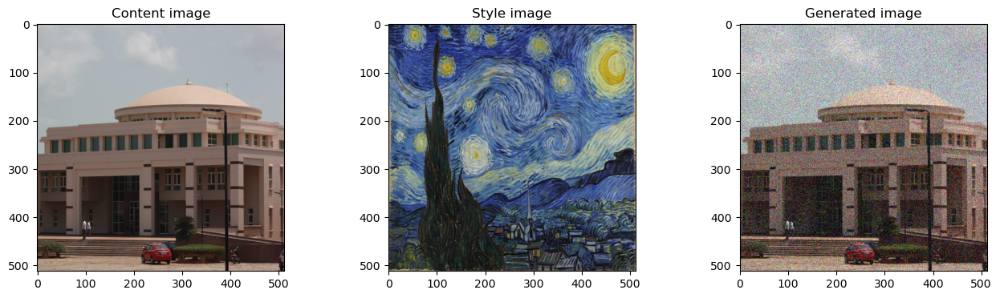

In [291]:
#Importing the images.
content_image = convert_to_tensor(path='images_organised/BITS_Van_Gogh/BITS_Content.jpeg',shape = (512,512))
style_image = convert_to_tensor(path='images_organised/BITS_Van_Gogh/Van_Gogh_Style_Image.jpeg',shape =(512,512))
generated_image = random_noise_generator_uniform(image=content_image,intensity=1)

show_images_in_a_row(content_image,style_image,generated_image)

In [292]:
#Preprocess the images.
content_image = preprocess_image(content_image)
style_image = preprocess_image(style_image)
generated_image = preprocess_image(generated_image)

In [293]:
#vgg19 = tf.keras.applications.vgg19.VGG19(include_top=False,input_shape=[512,512,3])
#tf.keras.models.save_model(model=vgg19,filepath='vgg19_model.keras')

#Loading the VGG-19 model from the directory.
vgg19 = tf.keras.models.load_model('vgg19_model.keras')

In [294]:
#Define model.
vgg_model_outputs = model_outputs(vgg19,STYLE_LAYERS=STYLE_LAYERS,CONTENT_LAYER=CONTENT_LAYER)

In [295]:
#Style and content representations feature maps.
content_encoded = vgg_model_outputs(content_image)
style_encoded = vgg_model_outputs(style_image)

Epoch: 4000
Loss: 693.0001


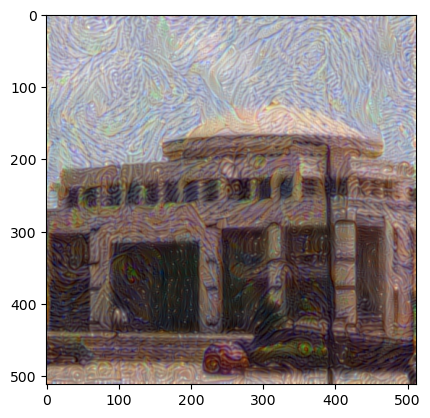

Epoch: 4100
Loss: 670.3220


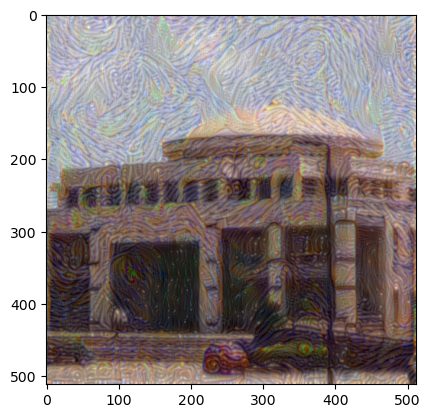

Epoch: 4200
Loss: 645.4622


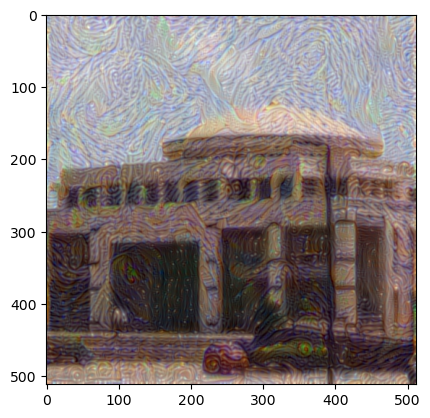

Epoch: 4300
Loss: 625.6597


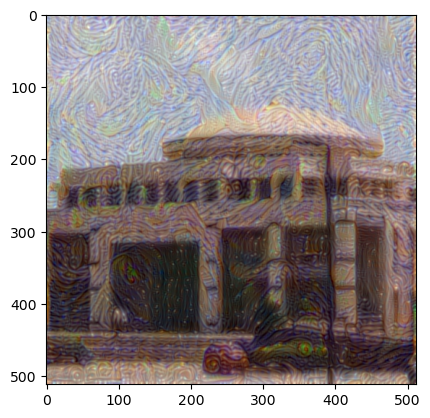

Epoch: 4400
Loss: 608.9016


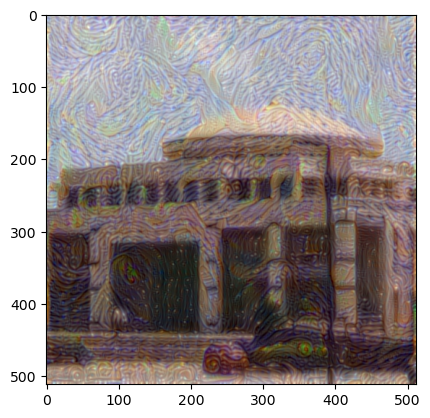

Epoch: 4500
Loss: 594.6334


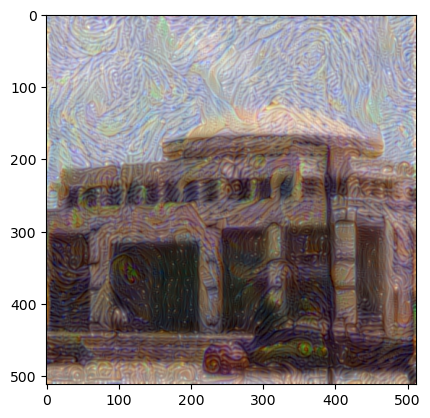

Epoch: 4600
Loss: 582.4584


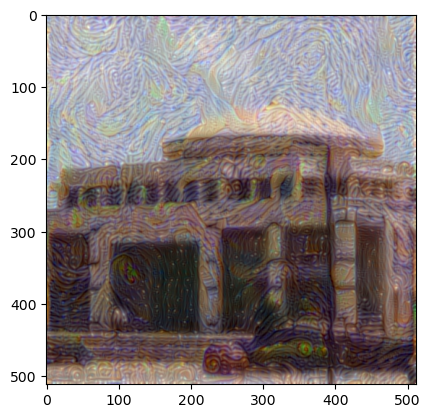

Epoch: 4700
Loss: 572.0363


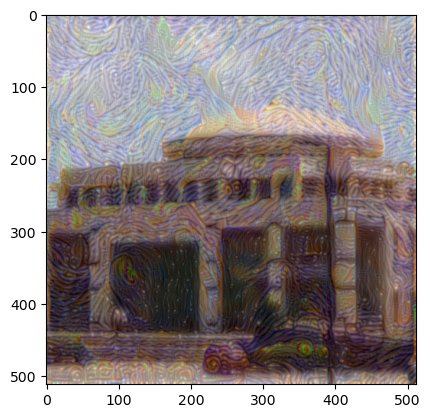

Epoch: 4800
Loss: 563.0251


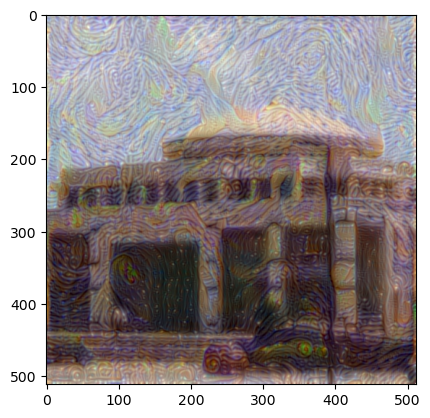

Epoch: 4900
Loss: 555.2075


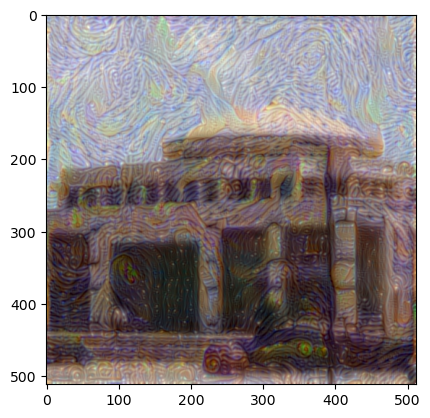

Epoch: 5000
Loss: 548.3165


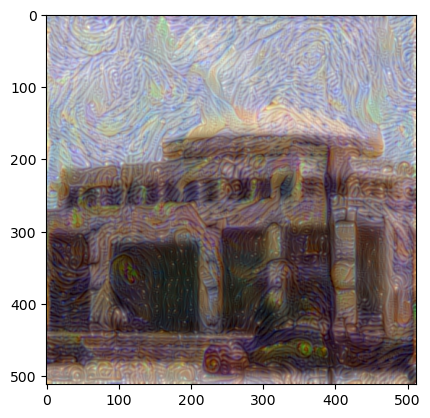

Epoch: 5100
Loss: 542.3093


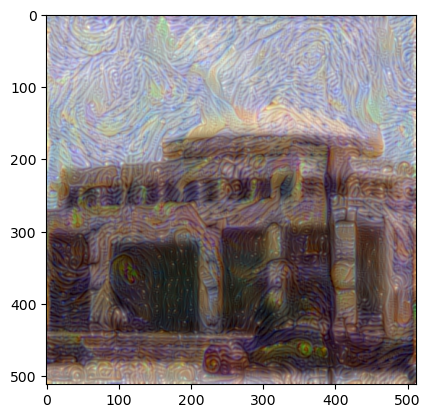

Epoch: 5200
Loss: 537.1053


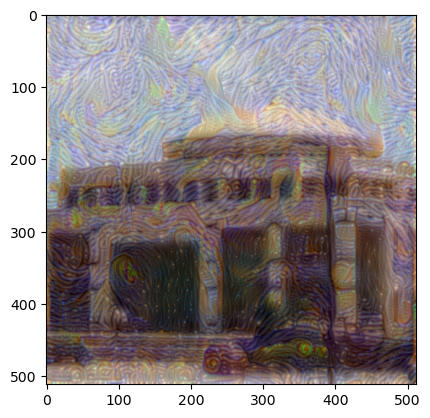

Epoch: 5300
Loss: 532.4548


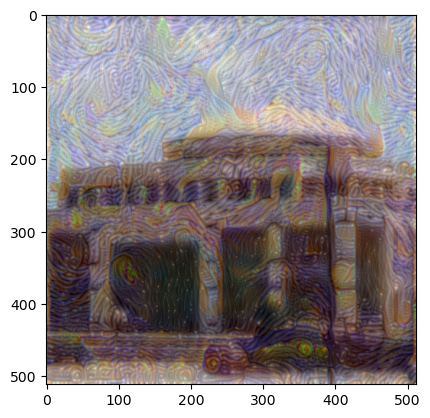

Epoch: 5400
Loss: 528.2787


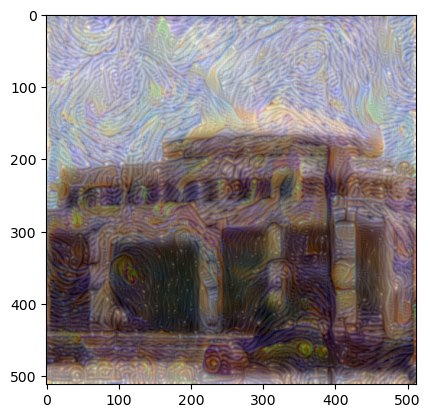

Epoch: 5500
Loss: 524.4809


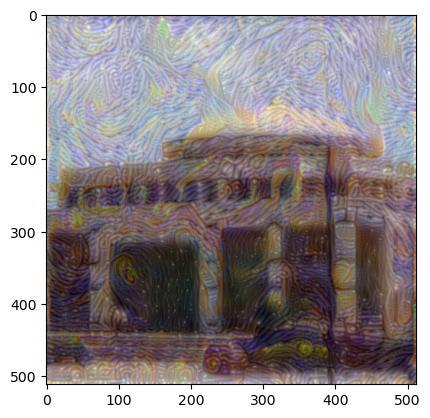

Epoch: 5600
Loss: 520.9901


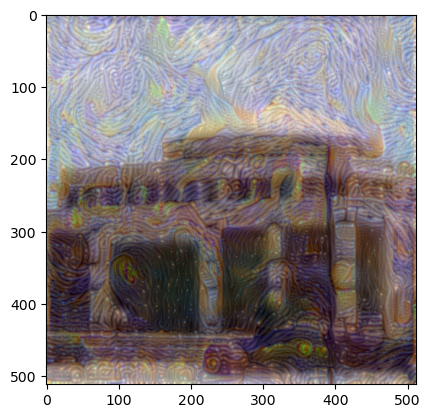

Epoch: 5700
Loss: 517.7318


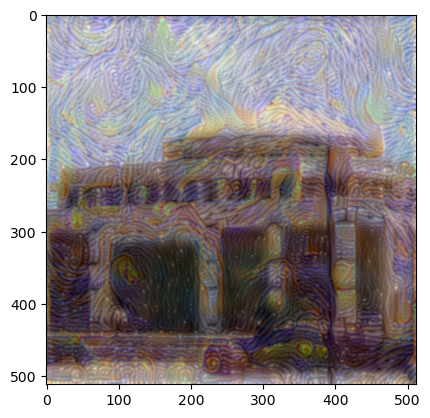

Epoch: 5800
Loss: 514.7001


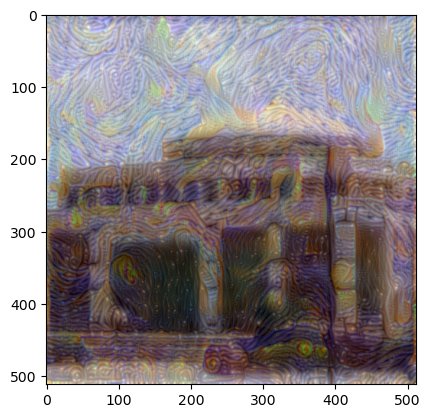

Epoch: 5900
Loss: 511.9595


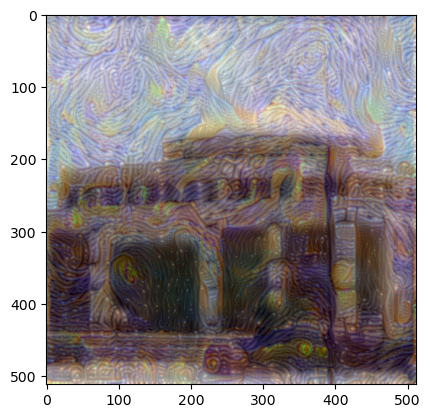

Epoch: 6000
Loss: 509.4157


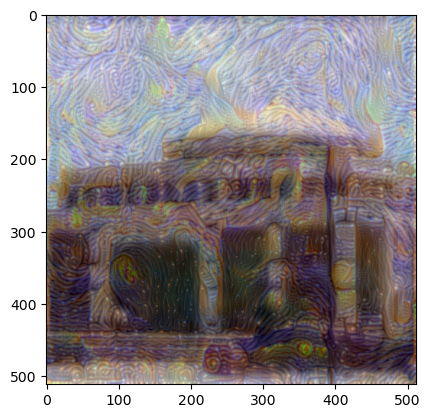

In [299]:
#Hyperparameters
epochs = 2000
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.001,beta_1=0.99)
print_every = 100
path = 'images_organised/BITS_Van_Gogh/Generated_Images/BITS_Gogh'
save_every = 500
content_weight = 10
style_weight = 400
total_variation_weight = 1.0

#Generating Loop
for i in range(epochs+1):
    
    #Get generated image and loss of a single train step.
    generated_image,l= train_step(model = vgg_model_outputs,
                                 generated_image = generated_image, 
                                 encoded_style = style_encoded,
                                 encoded_content = content_encoded,
                                 optimizer = optimizer,
                                 alpha=content_weight,
                                 beta=style_weight,
                                 gamma=total_variation_weight)
    
    
    #Reconvert generated image to tf.Variable object.
    generated_image = tf.Variable(generated_image)
    
    #Print every print_every epoch.
    if i%print_every == 0:
        print(f"Epoch: {i+4000}")
        print(f"Loss: {l:.4f}")
        image = convert_to_image(generated_image)
        plt.imshow(image)
        plt.show()
    
    #Save every save_every epoch.
    if i%save_every == 0:
        image = convert_to_image(generated_image)
        image.save(path+f'_{i+4000}.jpeg')
        

image = convert_to_image(generated_image)
image.save(path+'.jpeg')
                                 

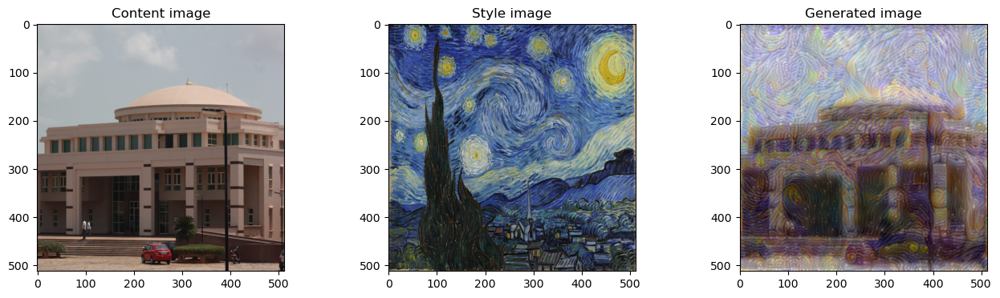

In [300]:
show_images_in_a_row(content_image=content_image,style_image=style_image,generated_image=generated_image)